In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('../input/quora-pair-questions/quora.csv')
df.sample(5)

,id,qid1,qid2,question1,question2,is_duplicate
158941,158941,248205,248206,Data Recovery: How do we restore deleted Viber...,Is there a way to get back deleted Viber messa...,0
361188,361188,491000,58778,Who are some lesser known important historical...,Who are some lesser known important historical...,0
334910,334910,462138,462139,What's a good product for Acne?,What is the best product for acne?,1
157989,157989,246890,246891,"In car engines, what is better: 100bhp@1500cc ...",Does 1500cc car engine refer to the total volu...,0
380593,380593,512221,512222,"Why does my family member say, “I don’t want t...",Why does my family members say all I do does d...,0


In [3]:
print('Size/Shape of dataset: ',df.shape)

Size/Shape of dataset:  (404290, 6)


0    255027
1    149263
Name: is_duplicate, dtype: int64
0    63.080215
1    36.919785
Name: is_duplicate, dtype: float64


<AxesSubplot:>

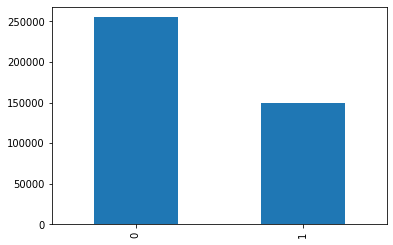

In [4]:
# Checking distribution of our dataset
print(df['is_duplicate'].value_counts())
print(df['is_duplicate'].value_counts()/df['is_duplicate'].count()*100)
df['is_duplicate'].value_counts().plot(kind = 'bar')

In [5]:
# Number of Repeated Questions ?
qid = pd.Series(df['qid1'] + df['qid2'])  # Since each question has unique iid
print('Number of Unique Questions:', np.unique(qid).shape[0])
x = qid.value_counts()>1
print('Number of Repeated Questions:',x[x].shape[0])

Number of Unique Questions: 347345
Number of Repeated Questions: 50205


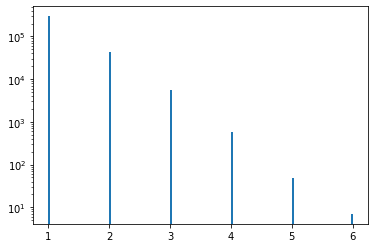

In [6]:
# Repeated Questions Histogram
plt.hist(qid.value_counts(), bins = 160)
plt.yscale('log')
plt.show()

In [7]:
# Checking missing data in our dataset
df.isnull().sum()

id              0
qid1            0
qid2            0
question1       1
question2       2
is_duplicate    0
dtype: int64

In [8]:
# Taking sanple to work on it quickly
new_df = df.sample(50000,random_state=2)

In [9]:
# Checking missing values in our sample
new_df.isnull().sum()

id              0
qid1            0
qid2            0
question1       0
question2       0
is_duplicate    0
dtype: int64

<b> Since there is no missing dat ain our sample, so no need to clean it

## Data Preprocessing

In [10]:
import regex as re
from bs4 import BeautifulSoup
from nltk.stem import *

In [11]:
def preprocess(q):
    # Lowering the text
    q = str(q).lower().strip()
    
     # Replace certain special characters with their string equivalents
    q = q.replace('%', ' percent')
    q = q.replace('$', ' dollar ')
    q = q.replace('₹', ' rupee ')
    q = q.replace('€', ' euro ')
    q = q.replace('@', ' at ')
    
    # The pattern '[math]' appears around 900 times in the whole dataset.
    q = q.replace('[math]', '')
    
     # Replacing some numbers with string equivalents (not perfect, can be done better to account for more cases)
    q = q.replace(',000,000,000 ', 'b ')
    q = q.replace(',000,000 ', 'm ')
    q = q.replace(',000 ', 'k ')
    q = re.sub(r'([0-9]+)000000000', r'\1b', q)
    q = re.sub(r'([0-9]+)000000', r'\1m', q)
    q = re.sub(r'([0-9]+)000', r'\1k', q)
    
    # Removing HTML tags
    q = BeautifulSoup(q)
    q = q.get_text()
    
     # Remove punctuations
    pattern = re.compile('\W')
    q = re.sub(pattern, ' ', q).strip()
    
    # PorterStemmer - For Stemming words
    port = PorterStemmer()
    q = port.stem(q)
    
    contractions = { 
    "ain't": "am not",
    "aren't": "are not",
    "can't": "can not",
    "can't've": "can not have",
    "'cause": "because",
    "could've": "could have",
    "couldn't": "could not",
    "couldn't've": "could not have",
    "didn't": "did not",
    "doesn't": "does not",
    "don't": "do not",
    "hadn't": "had not",
    "hadn't've": "had not have",
    "hasn't": "has not",
    "haven't": "have not",
    "he'd": "he would",
    "he'd've": "he would have",
    "he'll": "he will",
    "he'll've": "he will have",
    "he's": "he is",
    "how'd": "how did",
    "how'd'y": "how do you",
    "how'll": "how will",
    "how's": "how is",
    "i'd": "i would",
    "i'd've": "i would have",
    "i'll": "i will",
    "i'll've": "i will have",
    "i'm": "i am",
    "i've": "i have",
    "isn't": "is not",
    "it'd": "it would",
    "it'd've": "it would have",
    "it'll": "it will",
    "it'll've": "it will have",
    "it's": "it is",
    "let's": "let us",
    "ma'am": "madam",
    "mayn't": "may not",
    "might've": "might have",
    "mightn't": "might not",
    "mightn't've": "might not have",
    "must've": "must have",
    "mustn't": "must not",
    "mustn't've": "must not have",
    "needn't": "need not",
    "needn't've": "need not have",
    "o'clock": "of the clock",
    "oughtn't": "ought not",
    "oughtn't've": "ought not have",
    "shan't": "shall not",
    "sha'n't": "shall not",
    "shan't've": "shall not have",
    "she'd": "she would",
    "she'd've": "she would have",
    "she'll": "she will",
    "she'll've": "she will have",
    "she's": "she is",
    "should've": "should have",
    "shouldn't": "should not",
    "shouldn't've": "should not have",
    "so've": "so have",
    "so's": "so as",
    "that'd": "that would",
    "that'd've": "that would have",
    "that's": "that is",
    "there'd": "there would",
    "there'd've": "there would have",
    "there's": "there is",
    "they'd": "they would",
    "they'd've": "they would have",
    "they'll": "they will",
    "they'll've": "they will have",
    "they're": "they are",
    "they've": "they have",
    "to've": "to have",
    "wasn't": "was not",
    "we'd": "we would",
    "we'd've": "we would have",
    "we'll": "we will",
    "we'll've": "we will have",
    "we're": "we are",
    "we've": "we have",
    "weren't": "were not",
    "what'll": "what will",
    "what'll've": "what will have",
    "what're": "what are",
    "what's": "what is",
    "what've": "what have",
    "when's": "when is",
    "when've": "when have",
    "where'd": "where did",
    "where's": "where is",
    "where've": "where have",
    "who'll": "who will",
    "who'll've": "who will have",
    "who's": "who is",
    "who've": "who have",
    "why's": "why is",
    "why've": "why have",
    "will've": "will have",
    "won't": "will not",
    "won't've": "will not have",
    "would've": "would have",
    "wouldn't": "would not",
    "wouldn't've": "would not have",
    "y'all": "you all",
    "y'all'd": "you all would",
    "y'all'd've": "you all would have",
    "y'all're": "you all are",
    "y'all've": "you all have",
    "you'd": "you would",
    "you'd've": "you would have",
    "you'll": "you will",
    "you'll've": "you will have",
    "you're": "you are",
    "you've": "you have"
    }

    q_decontracted = []

    for word in q.split():
        if word in contractions:
            word = contractions[word]

        q_decontracted.append(word)

    q = ' '.join(q_decontracted)
    q = q.replace("'ve", " have")
    q = q.replace("n't", " not")
    q = q.replace("'re", " are")
    q = q.replace("'ll", " will")
    
    
    return q

In [12]:
preprocess("He WAS @ ? 000,000 Running")

'he was at 000k run'

In [13]:
new_df['question1'] = new_df['question1'].apply(preprocess)
new_df['question2'] = new_df['question2'].apply(preprocess)

new_df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wha...,0


## Creation of Basic Features

**1. Length of questions<br>
2. Number of words<br>
3. Common words<br>
4. Total words<br>
5. Word share<br>
6. Frquency of Question id's<br>
7. Frquency q1 +  Frquency q2<br>
8. Frquency q1 -  Frquency q2**


In [14]:
# 1 - Length of questions

new_df['q1_len'] = new_df['question1'].str.len() 
new_df['q2_len'] = new_df['question2'].str.len()

new_df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,73,74
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wha...,0,47,55


minimum characters 1
maximum characters 391
average num of characters 56


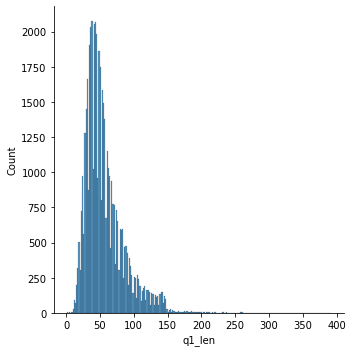

In [15]:
# Analysis of Feature - Length of questions

sns.displot(new_df['q1_len'])
print('minimum characters',new_df['q1_len'].min())
print('maximum characters',new_df['q1_len'].max())
print('average num of characters',int(new_df['q1_len'].mean()))

minimum characters 0
maximum characters 1128
average num of characters 57


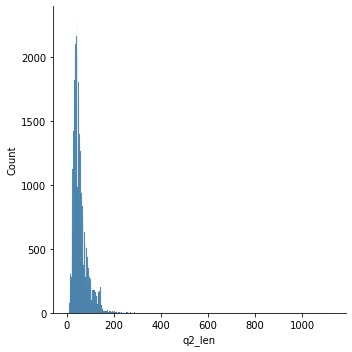

In [16]:
sns.displot(new_df['q2_len'])
print('minimum characters',new_df['q2_len'].min())
print('maximum characters',new_df['q2_len'].max())
print('average num of characters',int(new_df['q2_len'].mean()))

In [17]:
# 2 - Number of words

new_df['q1_num_words'] = new_df['question1'].apply(lambda row: len(row.split(" ")))
new_df['q2_num_words'] = new_df['question2'].apply(lambda row: len(row.split(" ")))

new_df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,73,74,13,13
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wha...,0,47,55,12,15


minimum words 1
maximum words 73
average num of words 11


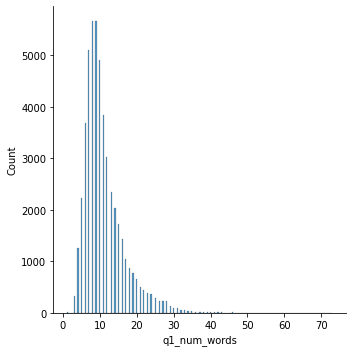

In [18]:
# Analysis of Feature - Number of words
sns.displot(new_df['q1_num_words'])
print('minimum words',new_df['q1_num_words'].min())
print('maximum words',new_df['q1_num_words'].max())
print('average num of words',int(new_df['q1_num_words'].mean()))

minimum words 1
maximum words 248
average num of words 11


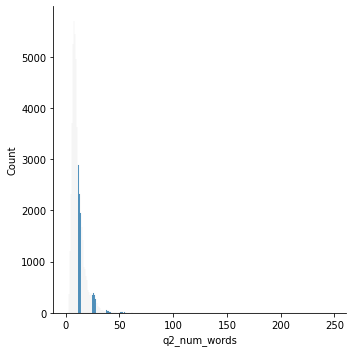

In [19]:
sns.displot(new_df['q2_num_words'])
print('minimum words',new_df['q2_num_words'].min())
print('maximum words',new_df['q2_num_words'].max())
print('average num of words',int(new_df['q2_num_words'].mean()))

In [20]:
# 3 - Common Words

def common_words(row):
    w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" "))) # Extracting unique words from question1
    w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" "))) # Extracting unique words from question2 
    return len(w1 & w2) # Applying intersection of unique words from both questions

In [21]:
new_df['word_common'] = new_df.apply(common_words, axis=1)
new_df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,73,74,13,13,12
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wha...,0,47,55,12,15,7


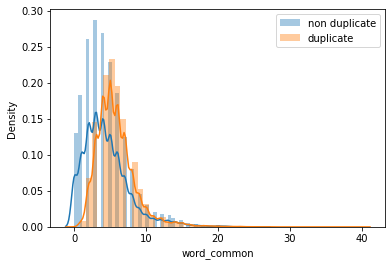

In [22]:
# Analysis of Feature - Common words
sns.distplot(new_df[new_df['is_duplicate'] == 0]['word_common'],label='non duplicate') # Number of common words where there is no duplicate
sns.distplot(new_df[new_df['is_duplicate'] == 1]['word_common'],label='duplicate')  # Number of common words where there is duplicate
plt.legend()
plt.show()

In [23]:
# 4 - Total words

def total_words(row):
    w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
    return (len(w1) + len(w2))

In [24]:
new_df['word_total'] = new_df.apply(total_words, axis=1)
new_df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common,word_total
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,73,74,13,13,12,26
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wha...,0,47,55,12,15,7,22


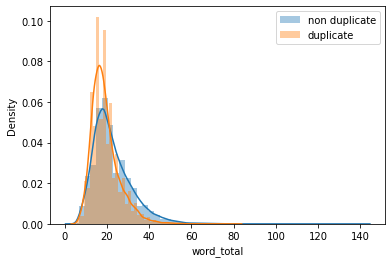

In [25]:
# Analysis of Feature - Total words

sns.distplot(new_df[new_df['is_duplicate'] == 0]['word_total'],label='non duplicate')
sns.distplot(new_df[new_df['is_duplicate'] == 1]['word_total'],label='duplicate')
plt.legend()
plt.show()

In [26]:
# 5 - Word share

new_df['word_share'] = round(new_df['word_common']/new_df['word_total'],2)
new_df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common,word_total,word_share
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,73,74,13,13,12,26,0.46
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wha...,0,47,55,12,15,7,22,0.32


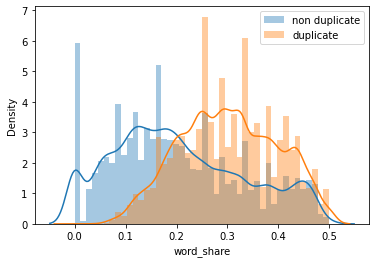

In [27]:
# Analysis of Feature - Word share

sns.distplot(new_df[new_df['is_duplicate'] == 0]['word_share'],label='non duplicate')
sns.distplot(new_df[new_df['is_duplicate'] == 1]['word_share'],label='duplicate')
plt.legend()
plt.show()

In [28]:
# 6 - Frquency of Question id's

new_df['freq_qid1']=new_df.groupby('qid1')['qid1'].transform('count')
new_df['freq_qid2']=new_df.groupby('qid2')['qid2'].transform('count')

In [29]:
# 7 - Frquency q1 +  Frquency q2

new_df['freq_q1+q2']= new_df['freq_qid1'] + new_df['freq_qid2']

In [30]:
# 7 - Frquency q1 -  Frquency q2

new_df['freq_q1-q2']= new_df['freq_qid1'] - new_df['freq_qid2']

In [31]:
new_df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common,word_total,word_share,freq_qid1,freq_qid2,freq_q1+q2,freq_q1-q2
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,73,74,13,13,12,26,0.46,1,1,2,0
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wha...,0,47,55,12,15,7,22,0.32,1,1,2,0


In [32]:
new_df.shape

(50000, 17)

#### Craetion of Basic Features - Alternative Method

In [33]:
"""


quest1_len=[]
quest2_len=[]
quest1_word_count=[]
quest2_word_count=[]
word_total=[]
word_common=[]
word_shared=[]

for i in (new_df['id']):
    
    q1=new_df['question1'][i]
    q2=new_df['question2'][i]
    q1_words = q1.split()
    q2_words = q2.split()
    total = len(set(q1_words)) + len(set(q2_words))
    unique_common = len(set(q1_words)&set(q2_words))
    
    # Append in the lists accordingly:
    quest1_len.append(len(q1))                            # length of question 1
    quest2_len.append(len(q2))                            # length of question 2
    quest1_word_count.append(len(q1_words))               # no. of words in question 1
    quest2_word_count.append(len(q2_words))               # no. of words in question 2
    word_total.append(total)                              # total number of unique words in question 1 & question 2
    word_common.append(unique_common)                     # total number of common unique words in question 1 & question 2
    word_shared.append(unique_common/ total)              # ratio of common unique words & total number of words
 
 
new_df['quest1_len'] = quest1_len
new_df['quest2_len'] = quest2_len
new_df['quest1_word_count'] = quest1_word_count
new_df['quest2_word_count'] = quest2_word_count
new_df['word_total'] = word_total
new_df['word_common'] = word_common
new_df['word_shared'] = word_shared
  

"""

"\n\n\nquest1_len=[]\nquest2_len=[]\nquest1_word_count=[]\nquest2_word_count=[]\nword_total=[]\nword_common=[]\nword_shared=[]\n\nfor i in (new_df['id']):\n    \n    q1=new_df['question1'][i]\n    q2=new_df['question2'][i]\n    q1_words = q1.split()\n    q2_words = q2.split()\n    total = len(set(q1_words)) + len(set(q2_words))\n    unique_common = len(set(q1_words)&set(q2_words))\n    \n    # Append in the lists accordingly:\n    quest1_len.append(len(q1))                            # length of question 1\n    quest2_len.append(len(q2))                            # length of question 2\n    quest1_word_count.append(len(q1_words))               # no. of words in question 1\n    quest2_word_count.append(len(q2_words))               # no. of words in question 2\n    word_total.append(total)                              # total number of unique words in question 1 & question 2\n    word_common.append(unique_common)                     # total number of common unique words in question 1 & 

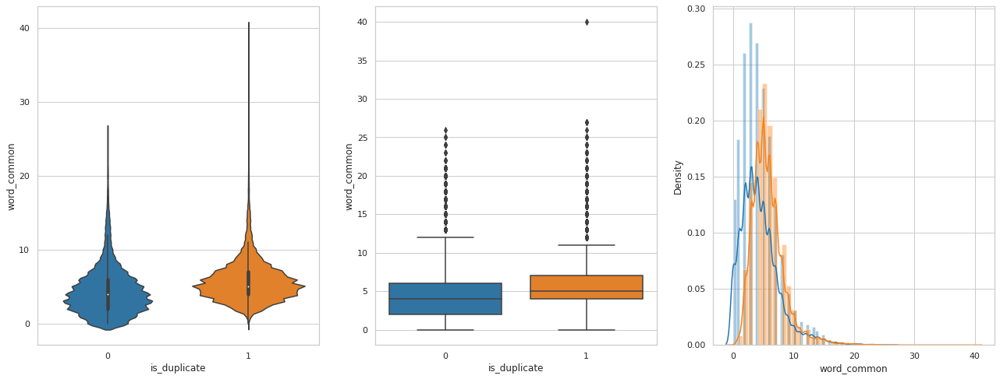

In [34]:
# Visualization of Basic Features - Combination

plt.figure(figsize=(22,8)) 
# customizing sns plots
sns.set_context("notebook", font_scale=1.0)
sns.set_style("whitegrid")

# 1st subplot - violin plot:
plt.subplot(1,3,1)
sns.violinplot(x='is_duplicate', y='word_common', data=new_df)

# 2nd subplot - box plot:
plt.subplot(1,3,2)
sns.boxplot(x='is_duplicate', y='word_common', data=new_df)

# 3rd subplot - pdf plot:
plt.subplot(1,3,3)
sns.distplot(new_df[new_df['is_duplicate']==0]['word_common'], label='0') # is_duplicate=0
sns.distplot(new_df[new_df['is_duplicate']==1]['word_common'], label='1') # is_duplicate=1

plt.show()

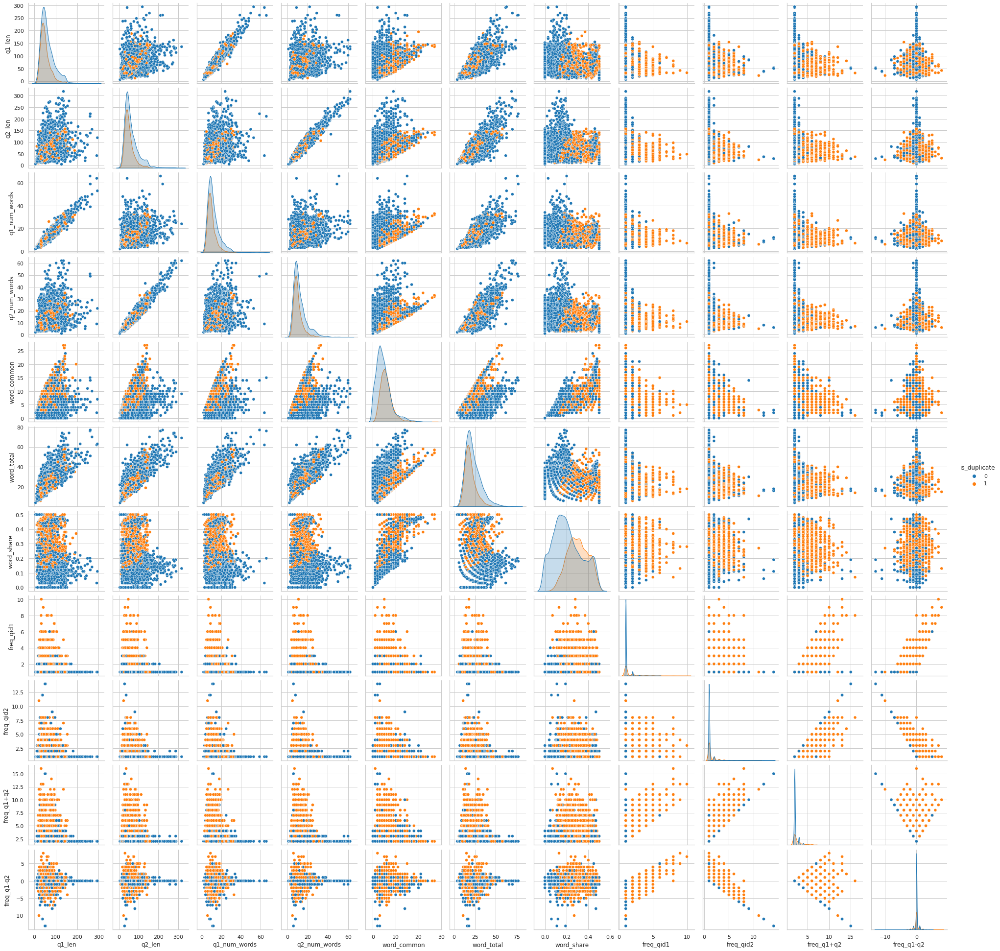

In [35]:
n = 10000
sns.pairplot(new_df[['q1_len', 'q2_len', 'q1_num_words', 'q2_num_words','word_common','word_total','word_share','freq_qid1','freq_qid2','freq_q1+q2','freq_q1-q2', 'is_duplicate']][0:n], hue='is_duplicate')

In [36]:
# to create group by 'is_duplicate'
g = new_df.groupby('is_duplicate')
g.get_group(0).head(2) # to get dataframe for is_duplicate = 0

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common,word_total,word_share,freq_qid1,freq_qid2,freq_q1+q2,freq_q1-q2
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wha...,0,47,55,12,15,7,22,0.32,1,1,2,0
327711,327711,454161,454162,i am from india and live abroad i met a guy fr...,t i e t to thapar university to thapar univers...,0,102,118,26,20,3,36,0.08,1,1,2,0


In [37]:
g.max() # getting max for all values

,id,qid1,qid2,question1,question2,q1_len,q2_len,q1_num_words,q2_num_words,word_common,word_total,word_share,freq_qid1,freq_qid2,freq_q1+q2,freq_q1-q2
is_duplicate,,,,,,,,,,,,,,,,
0,404279,537920,537921,ì am a net developer having 3 years of work ex...,z satisfies z 2 re z then prove locus parabola...,391,1128,73,248,26,141,0.5,8,14,16,7
1,404282,537591,537592,zero vector has no magnitude and direction why...,your favourite cuisin,257,289,50,66,40,81,0.5,10,14,19,9


In [38]:
g.describe()

id                                                          \
                count           mean            std   min       25%       50%   
is_duplicate                                                                    
0             31601.0  202994.531977  116756.142156   3.0  102169.0  202827.0   
1             18399.0  200399.522909  116524.406014  51.0   99512.5  199551.0   

                                     qid1                 ... freq_q1+q2  \
                   75%       max    count           mean  ...        75%   
is_duplicate                                              ...              
0             304449.0  404279.0  31601.0  246735.333470  ...        2.0   
1             300699.0  404282.0  18399.0  164728.199087  ...        3.0   

                   freq_q1-q2                                                
               max      count      mean       std   min  25%  50%  75%  max  
is_duplicate                                                                 
0             16.0    31601.0 -0.029271  0.670394 -13.0  0.0  0.0  0.0  7.0  
1             19.0    18399.0  0.005272  1.174208 -10.0  0.0  0.0  0.0  9.0  

[2 rows x 112 columns]

is_duplicate
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

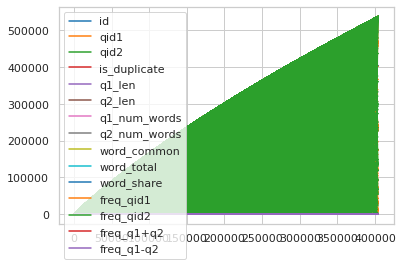

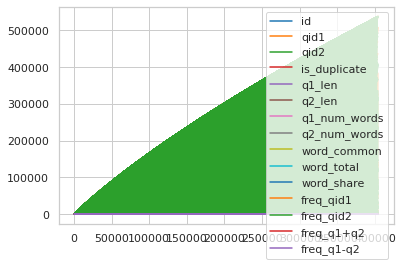

In [39]:
g.plot()

<AxesSubplot:xlabel='is_duplicate'>

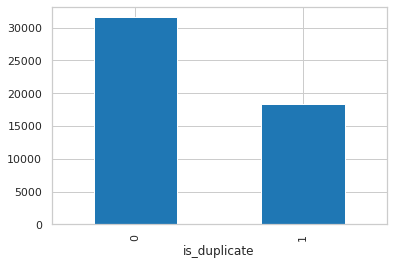

In [40]:
new_df.groupby("is_duplicate")['id'].count().plot.bar()

## Creation of Advanced Features

In [41]:

"""Definitions:

Token: Token is obtained by splitting up the sentence.
Word: A token that is not a stop-word.

Token Features:

1 - cwc_min: Ratio of common word count to the min(length(Q1),length(Q2))
 cwc_min = common_word_count / min(length(Q1),length(Q2))
2 - cwc_max: Ratio of common word count to the max(length(Q1),length(Q2))
 cwc_max = common_word_count / max(length(Q1),length(Q2))
3 - csc_min: Ratio of common stop-word count to the min(length(Q1),length(Q2))
 csc_min = common_stop_count / min(length(Q1),length(Q2))
4 - csc_max: Ratio of common stop-word count to the max(length(Q1),length(Q2))
 cwc_max = common_stop_count / max(length(Q1),length(Q2))
5 - ctc_min: Ratio of common token count to the min(length(Q1),length(Q2))
 ctc_min = common_token_count / min(length(Q1),length(Q2))
6 - ctc_max: Ratio of common token count to the max(length(Q1),length(Q2))
 ctc_min = common_token_count / max(length(Q1),length(Q2))
7 - last_word_eq: Check if last word of both questions are same or not (boolean)
8 - first_word_eq: Check if first word of both questions are same or not (boolean)


#  Length Based Features

1 - abs_len_diff: Absolute token-length difference between both the questions
 abs_len_diff = abs(length(Q1) - length(Q2))
2 - mean_len: Average token-length difference between both the questions
 mean_len = [length(Q1) + length(Q2)] / 2
3 - longest_substr_ratio: Ratio of length of longest common substring to the min(length(Q1),length(Q2))


#  Fuzzy Features

• fuzz_ratio: fuzz_ratio score from fuzzywuzzy
• fuzz_partial_ratio: fuzz_partial_ratio from fuzzywuzzy
• token_sort_ratio: token_sort_ratio from fuzzywuzzy
• token_set_ratio: token_set_ratio from fuzzywuzzy


We'll be using fuzzywuzzy librarry to get these features - fuzz_ratio, fuzz_partial_ratio, token_sort_ratio & token_set_ratio
Developer's blog :http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
Github link: https://github.com/seatgeek/fuzzywuzzy


"""

"Definitions:\n\nToken: Token is obtained by splitting up the sentence.\nWord: A token that is not a stop-word.\n\nToken Features:\n\n1 - cwc_min: Ratio of common word count to the min(length(Q1),length(Q2))\n cwc_min = common_word_count / min(length(Q1),length(Q2))\n2 - cwc_max: Ratio of common word count to the max(length(Q1),length(Q2))\n cwc_max = common_word_count / max(length(Q1),length(Q2))\n3 - csc_min: Ratio of common stop-word count to the min(length(Q1),length(Q2))\n csc_min = common_stop_count / min(length(Q1),length(Q2))\n4 - csc_max: Ratio of common stop-word count to the max(length(Q1),length(Q2))\n cwc_max = common_stop_count / max(length(Q1),length(Q2))\n5 - ctc_min: Ratio of common token count to the min(length(Q1),length(Q2))\n ctc_min = common_token_count / min(length(Q1),length(Q2))\n6 - ctc_max: Ratio of common token count to the max(length(Q1),length(Q2))\n ctc_min = common_token_count / max(length(Q1),length(Q2))\n7 - last_word_eq: Check if last word of both que

In [42]:
! pip install fuzzywuzzy
from fuzzywuzzy import fuzz
! pip install distance
import distance # to get the similarity between two words
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english')) # getting the stop-words

# initial values
safe_div = 0.0001 # using a constant to avoid division by zero error
cwc_min=[]
cwc_max=[]
csc_min=[]
csc_max=[]
ctc_min=[]
ctc_max=[]
abs_len_diff=[]
mean_len=[]
longest_substr_ratio=[]
last_word_eq=[]
first_word_eq=[]
longest_substr_ratio=[]
fuzz_ratio=[]
fuzz_partial_ratio=[]
fuzz_token_sort_ratio=[]
fuzz_token_set_ratio=[]


for i in (new_df['id']):
    # Storing the lengths & declaring the empty lists
    q1=new_df['question1'][i]
    q2=new_df['question2'][i]
    q1_len = len(q1)
    q2_len = len(q2)
    q1_tokens = q1.split()
    q2_tokens = q2.split()
    q1_stop = set()
    q2_stop = set()
    q1_words = set()
    q2_words = set()
    
    for token in q1_tokens:
        if token in stop_words:
            q1_stop.add(token) # storing the question1 stop-words
        else:
            q1_words.add(token) # storing the question1 words
    for token in q2_tokens:
        if token in stop_words:
            q2_stop.add(token) # storing the question2 stop-words
        else:
            q2_words.add(token) # storing the question2 words

    unique_common_word = len(q1_words & q2_words) # storing the common words
    unique_common_stop = len(q1_stop & q2_stop) # storing the common stop-words
    unique_common_tokens = len(set(q1_tokens) & set(q2_tokens)) # storing the common tokens
    
    # Calculating the above mentioned features and storing them in lists:
    cwc_min.append(unique_common_word/(min(len(q1_words),len(q2_words))+safe_div))
    cwc_max.append(unique_common_word/(max(len(q1_words),len(q2_words))+safe_div))
    csc_min.append(unique_common_stop/(min(len(q1_stop),len(q2_stop))+safe_div))
    csc_max.append(unique_common_stop/(max(len(q1_stop),len(q2_stop))+safe_div))
    ctc_min.append(unique_common_tokens/(min(len(q1_tokens),len(q2_tokens))+safe_div))
    ctc_max.append(unique_common_tokens/(max(len(q1_tokens),len(q2_tokens))+safe_div))
    abs_len_diff.append(abs(len(q1_tokens) - len(q2_tokens)))
    mean_len.append((len(q1_tokens) + len(q2_tokens))/2)
    
    try:
        longest_substr_ratio.append(len(list(distance.lcsubstrings(q1,q2))[0])/(min(q1_len,q2_len)+1))
    except IndexError as e:
        longest_substr_ratio.append(0)

    try:
        first_word_eq.append(int(q1_tokens[0]==q2_tokens[0]))
        last_word_eq.append(int(q1_tokens[-1]==q2_tokens[-1]))
    except IndexError as e:
        first_word_eq.append(0)
        last_word_eq.append(0)
    
    fuzz_ratio.append(fuzz.ratio(q1,q2))
    fuzz_partial_ratio.append(fuzz.partial_ratio(q1,q2))
    fuzz_token_sort_ratio.append(fuzz.token_sort_ratio(q1,q2))
    fuzz_token_set_ratio.append(fuzz.token_set_ratio(q1,q2))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.3/180.3 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... - done
  Created wheel for distance: filename=Distance-0.1.3-py3-none-any.whl size=16276 sha256=9aec38ee679b6d1b858cfe894018c360bc7f164b92da9daf7e25d35ff67f344c
  Stored in directory: /root/.cache/pip/wheels/b2/10/1b/96fca621a1be378e2fe104cfb0d160bb6cdf3d04a3d35266cc
Successfully built distance


In [43]:
# Moving the lists to the below new columns in the dataframe:
new_df['cwc_min'] = cwc_min
new_df['cwc_max'] = cwc_max
new_df['csc_min'] = csc_min
new_df['csc_max'] = csc_max
new_df['ctc_min'] = ctc_min
new_df['ctc_max'] = ctc_max
new_df['abs_len_diff'] = abs_len_diff
new_df['mean_length'] = mean_len
new_df['longest_substr_ratio'] = longest_substr_ratio
new_df['first_word_eq'] = first_word_eq
new_df['last_word_eq'] = last_word_eq
new_df['fuzz_ratio'] = fuzz_ratio
new_df['fuzz_partial_ratio'] = fuzz_partial_ratio
new_df['fuzz_token_sort_ratio'] = fuzz_token_sort_ratio
new_df['fuzz_token_set_ratio'] = fuzz_token_set_ratio

In [44]:
new_df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,...,ctc_max,abs_len_diff,mean_length,longest_substr_ratio,first_word_eq,last_word_eq,fuzz_ratio,fuzz_partial_ratio,fuzz_token_sort_ratio,fuzz_token_set_ratio
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,73,74,13,13,...,0.923070,0,13.0,0.878378,1,1,99,99,99,99
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wha...,0,47,55,12,15,...,0.466664,3,13.5,0.229167,1,1,69,66,67,74


#### Analysis of Token Features

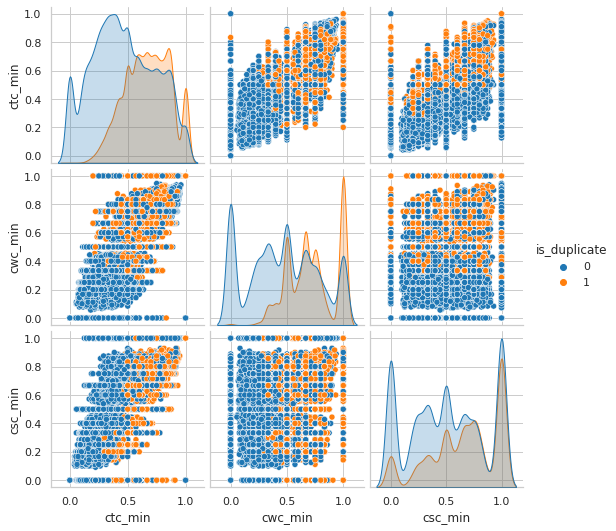

In [45]:
sns.pairplot(new_df[['ctc_min', 'cwc_min', 'csc_min', 'is_duplicate']],hue='is_duplicate')

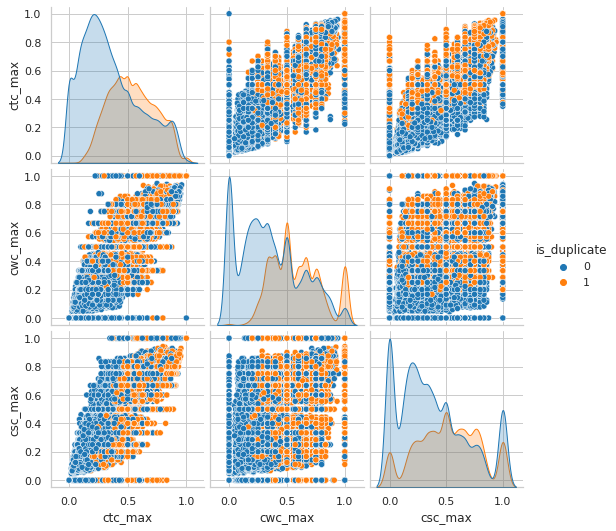

In [46]:
sns.pairplot(new_df[['ctc_max', 'cwc_max', 'csc_max', 'is_duplicate']],hue='is_duplicate')

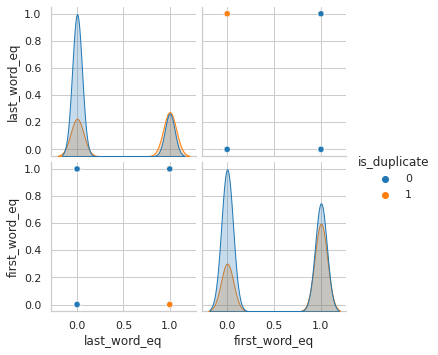

In [47]:
sns.pairplot(new_df[['last_word_eq', 'first_word_eq', 'is_duplicate']],hue='is_duplicate')

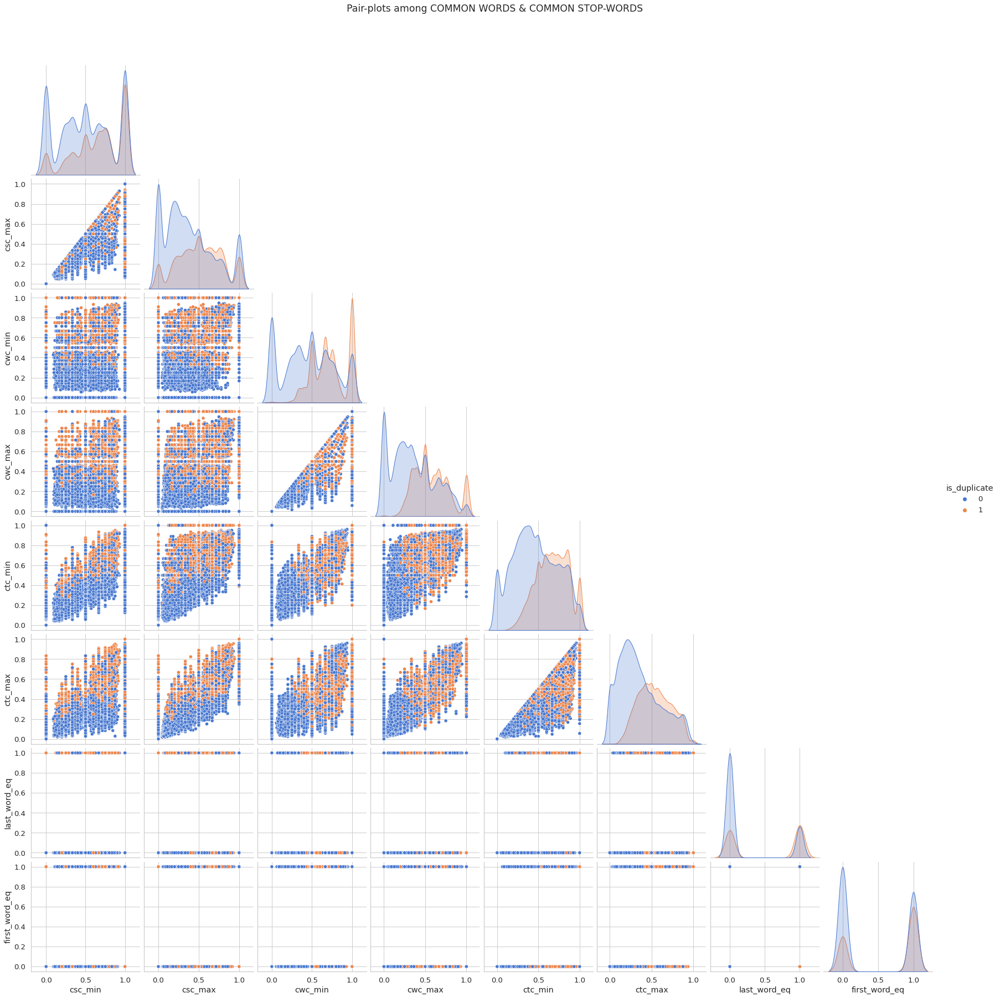

In [48]:
sns.set_palette('muted') # setting the color palette
#sns.set_style('dark')
sns.set_context('notebook',font_scale=1.2) # setting the font scale
#sns.set_style('ticks')
plot = sns.pairplot(data=new_df[['csc_min','csc_max','cwc_min','cwc_max','ctc_min','ctc_max','last_word_eq', 'first_word_eq','is_duplicate']], # dataframe
                    hue='is_duplicate', # set the class variable to colorize the plots
                    height=3, # size of the plot
                    corner=True) # remove the other identical diagonal plots ,plot_kws=dict(marker="+", linewidth=1))
plot.fig.suptitle("Pair-plots among COMMON WORDS & COMMON STOP-WORDS",y=1.05) # set the title
plt.show()

In [49]:
# Using TSNE for Dimentionality reduction for 15 Features(Generated after cleaning the data) to 3 dimention

from sklearn.preprocessing import MinMaxScaler

X = MinMaxScaler().fit_transform(new_df[['cwc_min', 'cwc_max', 'csc_min', 'csc_max' , 'ctc_min' , 'ctc_max' , 'last_word_eq', 'first_word_eq' ]])
y = new_df['is_duplicate'].values

In [50]:
from sklearn.manifold import TSNE

tsne2d = TSNE(
    n_components=2,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 50000 samples in 0.048s...
[t-SNE] Computed neighbors for 50000 samples in 4.801s...
[t-SNE] Computed conditional probabilities for sample 1000 / 50000
[t-SNE] Computed conditional probabilities for sample 2000 / 50000
[t-SNE] Computed conditional probabilities for sample 3000 / 50000
[t-SNE] Computed conditional probabilities for sample 4000 / 50000
[t-SNE] Computed conditional probabilities for sample 5000 / 50000
[t-SNE] Computed conditional probabilities for sample 6000 / 50000
[t-SNE] Computed conditional probabilities for sample 7000 / 50000
[t-SNE] Computed conditional probabilities for sample 8000 / 50000
[t-SNE] Computed conditional probabilities for sample 9000 / 50000
[t-SNE] Computed conditional probabilities for sample 10000 / 50000
[t-SNE] Computed conditional probabilities for sample 11000 / 50000
[t-SNE] Computed conditional probabilities for sample 12000 / 50000
[t-SNE] Computed conditional probabilities for sam

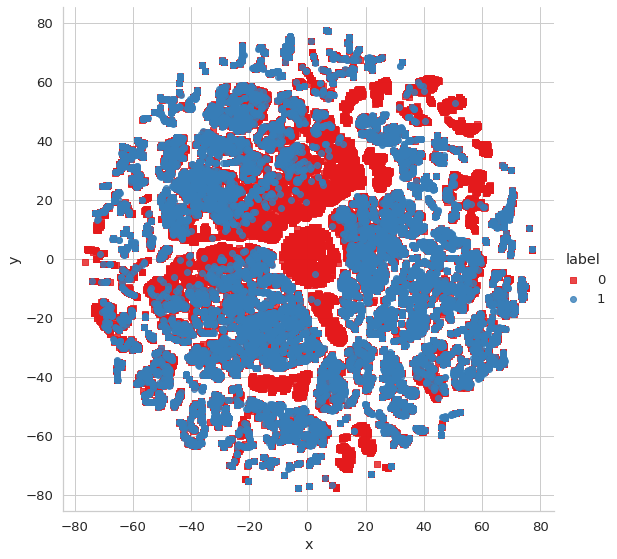

In [51]:
x_df = pd.DataFrame({'x':tsne2d[:,0], 'y':tsne2d[:,1] ,'label':y})

# draw the plot in appropriate place in the grid
sns.lmplot(data=x_df, x='x', y='y', hue='label', fit_reg=False, size=8,palette="Set1",markers=['s','o'])

In [52]:
tsne3d = TSNE(
    n_components=3,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 50000 samples in 0.049s...
[t-SNE] Computed neighbors for 50000 samples in 4.641s...
[t-SNE] Computed conditional probabilities for sample 1000 / 50000
[t-SNE] Computed conditional probabilities for sample 2000 / 50000
[t-SNE] Computed conditional probabilities for sample 3000 / 50000
[t-SNE] Computed conditional probabilities for sample 4000 / 50000
[t-SNE] Computed conditional probabilities for sample 5000 / 50000
[t-SNE] Computed conditional probabilities for sample 6000 / 50000
[t-SNE] Computed conditional probabilities for sample 7000 / 50000
[t-SNE] Computed conditional probabilities for sample 8000 / 50000
[t-SNE] Computed conditional probabilities for sample 9000 / 50000
[t-SNE] Computed conditional probabilities for sample 10000 / 50000
[t-SNE] Computed conditional probabilities for sample 11000 / 50000
[t-SNE] Computed conditional probabilities for sample 12000 / 50000
[t-SNE] Computed conditional probabilities for sam

In [53]:
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.offline as py
py.init_notebook_mode(connected=True)

trace1 = go.Scatter3d(
    x=tsne3d[:,0],
    y=tsne3d[:,1],
    z=tsne3d[:,2],
    mode='markers',
    marker=dict(
        sizemode='diameter',
        color = y,
        colorscale = 'Portland',
        colorbar = dict(title = 'duplicate'),
        line=dict(color='rgb(255, 255, 255)'),
        opacity=0.75
    )
)

data=[trace1]
layout=dict(height=800, width=800, title='3d embedding with engineered features')
fig=dict(data=data, layout=layout)
py.iplot(fig, filename='3DBubble')

#### Analysis of Length Based Features

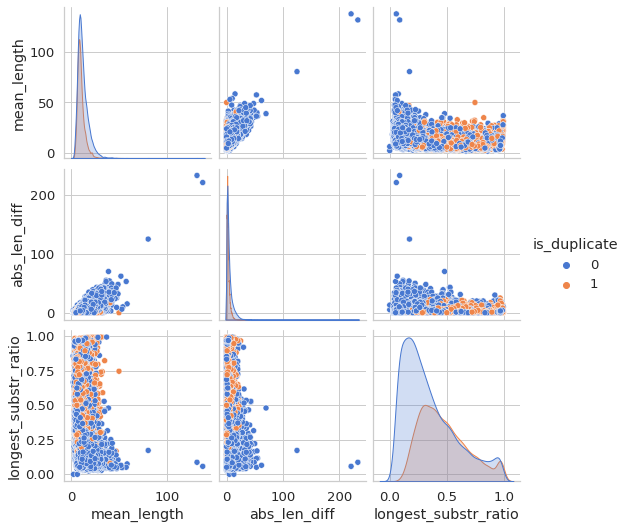

In [54]:
sns.pairplot(new_df[['mean_length', 'abs_len_diff','longest_substr_ratio', 'is_duplicate']],hue='is_duplicate')

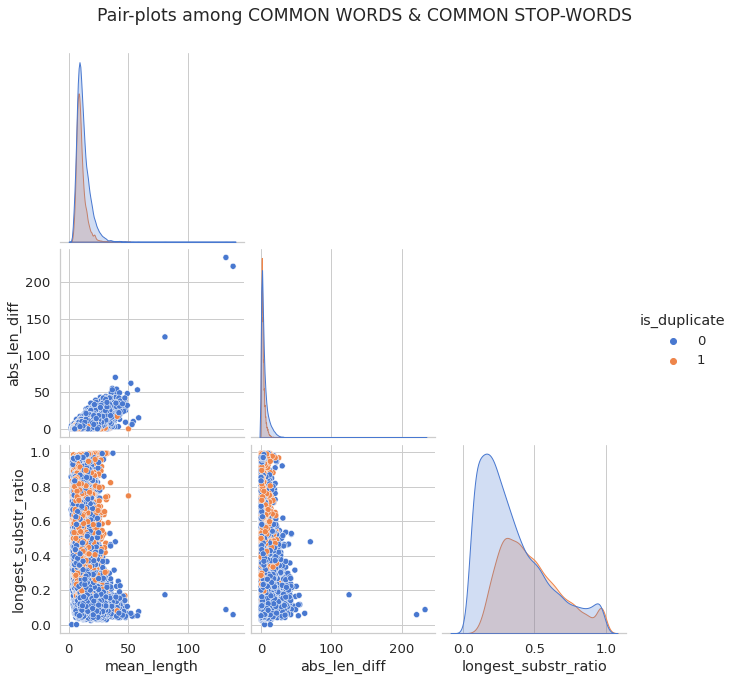

In [55]:
sns.set_palette('muted') # setting the color palette
#sns.set_style('dark')
sns.set_context('notebook',font_scale=1.2) # setting the font scale
#sns.set_style('ticks')
plot = sns.pairplot(data=new_df[['mean_length', 'abs_len_diff','longest_substr_ratio', 'is_duplicate']], # dataframe
                    hue='is_duplicate', # set the class variable to colorize the plots
                    height=3, # size of the plot
                    corner=True) # remove the other identical diagonal plots ,plot_kws=dict(marker="+", linewidth=1))
plot.fig.suptitle("Pair-plots among COMMON WORDS & COMMON STOP-WORDS",y=1.05) # set the title
plt.show()

In [56]:
# Using TSNE for Dimentionality reduction for 15 Features(Generated after cleaning the data) to 3 dimention

from sklearn.preprocessing import MinMaxScaler

X = MinMaxScaler().fit_transform(new_df[[ 'mean_length', 'abs_len_diff','longest_substr_ratio' ]])
y = new_df['is_duplicate'].values

In [57]:
from sklearn.manifold import TSNE

tsne2d = TSNE(
    n_components=2,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 50000 samples in 0.025s...
[t-SNE] Computed neighbors for 50000 samples in 1.159s...
[t-SNE] Computed conditional probabilities for sample 1000 / 50000
[t-SNE] Computed conditional probabilities for sample 2000 / 50000
[t-SNE] Computed conditional probabilities for sample 3000 / 50000
[t-SNE] Computed conditional probabilities for sample 4000 / 50000
[t-SNE] Computed conditional probabilities for sample 5000 / 50000
[t-SNE] Computed conditional probabilities for sample 6000 / 50000
[t-SNE] Computed conditional probabilities for sample 7000 / 50000
[t-SNE] Computed conditional probabilities for sample 8000 / 50000
[t-SNE] Computed conditional probabilities for sample 9000 / 50000
[t-SNE] Computed conditional probabilities for sample 10000 / 50000
[t-SNE] Computed conditional probabilities for sample 11000 / 50000
[t-SNE] Computed conditional probabilities for sample 12000 / 50000
[t-SNE] Computed conditional probabilities for sam

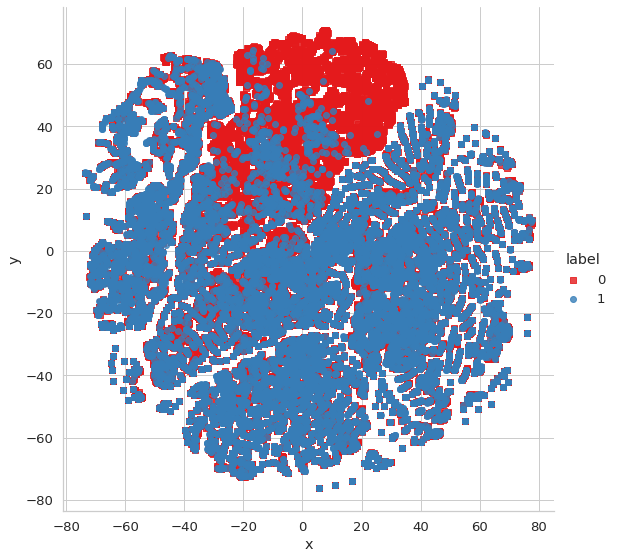

In [58]:
x_df = pd.DataFrame({'x':tsne2d[:,0], 'y':tsne2d[:,1] ,'label':y})

# draw the plot in appropriate place in the grid
sns.lmplot(data=x_df, x='x', y='y', hue='label', fit_reg=False, size=8,palette="Set1",markers=['s','o'])

In [59]:
tsne3d = TSNE(
    n_components=3,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 50000 samples in 0.024s...
[t-SNE] Computed neighbors for 50000 samples in 1.141s...
[t-SNE] Computed conditional probabilities for sample 1000 / 50000
[t-SNE] Computed conditional probabilities for sample 2000 / 50000
[t-SNE] Computed conditional probabilities for sample 3000 / 50000
[t-SNE] Computed conditional probabilities for sample 4000 / 50000
[t-SNE] Computed conditional probabilities for sample 5000 / 50000
[t-SNE] Computed conditional probabilities for sample 6000 / 50000
[t-SNE] Computed conditional probabilities for sample 7000 / 50000
[t-SNE] Computed conditional probabilities for sample 8000 / 50000
[t-SNE] Computed conditional probabilities for sample 9000 / 50000
[t-SNE] Computed conditional probabilities for sample 10000 / 50000
[t-SNE] Computed conditional probabilities for sample 11000 / 50000
[t-SNE] Computed conditional probabilities for sample 12000 / 50000
[t-SNE] Computed conditional probabilities for sam

In [60]:
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.offline as py
py.init_notebook_mode(connected=True)

trace1 = go.Scatter3d(
    x=tsne3d[:,0],
    y=tsne3d[:,1],
    z=tsne3d[:,2],
    mode='markers',
    marker=dict(
        sizemode='diameter',
        color = y,
        colorscale = 'Portland',
        colorbar = dict(title = 'duplicate'),
        line=dict(color='rgb(255, 255, 255)'),
        opacity=0.75
    )
)

data=[trace1]
layout=dict(height=800, width=800, title='3d embedding with engineered features')
fig=dict(data=data, layout=layout)
py.iplot(fig, filename='3DBubble')

#### Analysis of Fuzzy Features

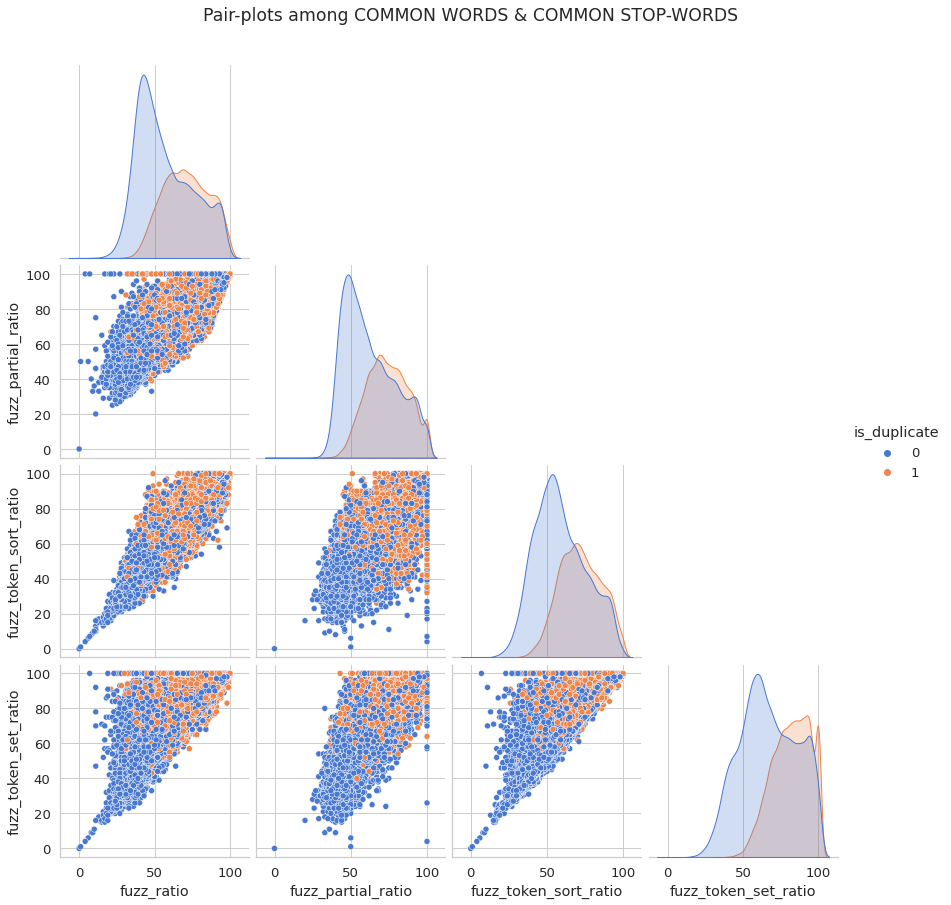

In [61]:
sns.set_palette('muted') # setting the color palette
#sns.set_style('dark')
sns.set_context('notebook',font_scale=1.2) # setting the font scale
#sns.set_style('ticks')
plot = sns.pairplot(data=new_df[['fuzz_ratio', 'fuzz_partial_ratio','fuzz_token_sort_ratio','fuzz_token_set_ratio', 'is_duplicate']], # dataframe
                    hue='is_duplicate', # set the class variable to colorize the plots
                    height=3, # size of the plot
                    corner=True) # remove the other identical diagonal plots ,plot_kws=dict(marker="+", linewidth=1))
plot.fig.suptitle("Pair-plots among COMMON WORDS & COMMON STOP-WORDS",y=1.05) # set the title
plt.show()

## Feature Vectorization

#### 1. Bag of Words

In [62]:
ques_df = new_df[['question1','question2']]
ques_df.head(2)

,question1,question2
398782,what is the best marketing automation tool for...,what is the best marketing automation tool for...
115086,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wha...


In [63]:
from sklearn.feature_extraction.text import CountVectorizer
# merge texts
questions = list(ques_df['question1']) + list(ques_df['question2'])

cv = CountVectorizer(max_features=3000)
q1_arr, q2_arr = np.vsplit(cv.fit_transform(questions).toarray(),2)

In [64]:
temp_df1 = pd.DataFrame(q1_arr, index= ques_df.index)
temp_df2 = pd.DataFrame(q2_arr, index= ques_df.index)
temp_df = pd.concat([temp_df1, temp_df2], axis=1)
temp_df.shape

(50000, 6000)

#### 2. Tf-Idf

In [65]:
"""
dfq1, dfq2 = new_df[['qid1', 'question1']], new_df[['qid2', 'question2']]
dfq1.columns = ['qid1', 'question']
dfq2.columns = ['qid2', 'question']

# merge two two dfs, there are two nans for question
dfqa = pd.concat((dfq1, dfq2), axis=0).fillna("")
nrows_for_q1 = dfqa.shape[0]/2
dfqa.shape= dfqa.shape[0]/2
dfqa.shape
"""

'\ndfq1, dfq2 = new_df[[\'qid1\', \'question1\']], new_df[[\'qid2\', \'question2\']]\ndfq1.columns = [\'qid1\', \'question\']\ndfq2.columns = [\'qid2\', \'question\']\n\n# merge two two dfs, there are two nans for question\ndfqa = pd.concat((dfq1, dfq2), axis=0).fillna("")\nnrows_for_q1 = dfqa.shape[0]/2\ndfqa.shape= dfqa.shape[0]/2\ndfqa.shape\n'

## Model Building

In [66]:
print(new_df.shape)
new_df.head(2)

(50000, 32)


,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,...,ctc_max,abs_len_diff,mean_length,longest_substr_ratio,first_word_eq,last_word_eq,fuzz_ratio,fuzz_partial_ratio,fuzz_token_sort_ratio,fuzz_token_set_ratio
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,73,74,13,13,...,0.923070,0,13.0,0.878378,1,1,99,99,99,99
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wha...,0,47,55,12,15,...,0.466664,3,13.5,0.229167,1,1,69,66,67,74


In [67]:
df3 = new_df.drop(columns=['id','qid1','qid2','question1','question2'])
print(df3.shape)
df3.head(2)

(50000, 27)


,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common,word_total,word_share,freq_qid1,freq_qid2,...,ctc_max,abs_len_diff,mean_length,longest_substr_ratio,first_word_eq,last_word_eq,fuzz_ratio,fuzz_partial_ratio,fuzz_token_sort_ratio,fuzz_token_set_ratio
398782,1,73,74,13,13,12,26,0.46,1,1,...,0.923070,0,13.0,0.878378,1,1,99,99,99,99
115086,0,47,55,12,15,7,22,0.32,1,1,...,0.466664,3,13.5,0.229167,1,1,69,66,67,74


In [68]:
print(temp_df.shape)
temp_df.head(2)

(50000, 6000)


,0,1,2,3,4,5,6,7,8,9,...,2990,2991,2992,2993,2994,2995,2996,2997,2998,2999
398782,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
115086,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [69]:
final_df = pd.concat([df3, temp_df], axis=1)
print(final_df.shape)
final_df.head(2)

(50000, 6027)


,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common,word_total,word_share,freq_qid1,freq_qid2,...,2990,2991,2992,2993,2994,2995,2996,2997,2998,2999
398782,1,73,74,13,13,12,26,0.46,1,1,...,0,0,0,0,0,0,0,0,0,0
115086,0,47,55,12,15,7,22,0.32,1,1,...,0,0,0,0,0,0,0,0,0,0


In [70]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(final_df.iloc[:,1:].values,final_df.iloc[:,0].values,test_size=0.2,random_state=1)

In [71]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
rf = RandomForestClassifier()
rf.fit(X_train,y_train)
y_pred = rf.predict(X_test)
accuracy_score(y_test,y_pred)

0.8011

In [72]:
from sklearn.metrics import confusion_matrix
# for random forest model
confusion_matrix(y_test,y_pred)

array([[5543,  742],
       [1247, 2468]])

In [73]:
from xgboost import XGBClassifier
xgb = XGBClassifier()
xgb.fit(X_train,y_train)
y_pred = xgb.predict(X_test)
accuracy_score(y_test,y_pred)

0.8044

In [74]:
# for xgboost model
confusion_matrix(y_test,y_pred)

array([[5436,  849],
       [1107, 2608]])

<b> Since cost of miss classification is very high. It will have bad user experience. If False Positive value is high, it will impact a lot. In the case of xgboost, the value of F.P is higher than that of random forest. So choose Random Forest as a model.

In [75]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train,y_train)
y_pred = gnb.predict(X_test)
accuracy_score(y_test,y_pred)

0.6175

In [76]:
# for gaussian naive bayes model
confusion_matrix(y_test,y_pred)

array([[3338, 2947],
       [ 878, 2837]])

#### Use K Fold cross validation to measure accuracy of our Random Forest Model

In [77]:
from sklearn.model_selection import KFold,cross_val_score
cvs = cross_val_score(rf, X_train,y_train, cv = 10)
cvs, cvs.mean()

(array([0.808  , 0.80675, 0.80575, 0.7975 , 0.7965 , 0.80375, 0.799  ,
        0.79975, 0.80125, 0.79975]),
 0.8017999999999998)

#### Use of ShuffleSplit (to equally distribute the data for model building)

In [78]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score

cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
cross_val_score(RandomForestClassifier(), X_train, y_train, cv=cv)

array([0.7995  , 0.79925 , 0.806375, 0.8085  , 0.801625])

<b>We can see that in 5 iterations we get a score above 80% all the time. This is pretty good but we want to test few other algorithms for regression to see if we can get even better score.

### Hyper Parameter Tuning (Find best model using GridSearchCV)

In [79]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

In [80]:
"""
from sklearn.tree import DecisionTreeClassifier

def find_best_model_using_gridsearchcv(X,y):
    algos = {
        'gradient_boost_classifier' : {
            'model': GradientBoostingClassifier(),
            'params': {
                'n_estimators': [50,100,150,200],
                'max_depth':[4,5,6,7,8]
            }
        },
        'support_vector_classifier': {
            'model': SVC(),
            'params': {
                'kernel': ['linear', 'poly', 'rbf', 'sigmoid', 'precomputed'],
                'gamma': ['scale', 'auto']
            }
        },
        'decision_tree': {
            'model': DecisionTreeClassifier(),
            'params': {
                'criterion' : ['mse','friedman_mse'],
                'splitter': ['best','random']
            }
        }
    }
    scores = []
    cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
    for algo_name, config in algos.items():
        gs =  GridSearchCV(config['model'], config['params'], cv=cv, return_train_score=False)
        gs.fit(X,y)
        scores.append({
            'model': algo_name,
            'best_score': gs.best_score_,
            'best_params': gs.best_params_
        })

    return pd.DataFrame(scores,columns=['model','best_score','best_params'])

find_best_model_using_gridsearchcv(X,y)
"""

"\nfrom sklearn.tree import DecisionTreeClassifier\n\ndef find_best_model_using_gridsearchcv(X,y):\n    algos = {\n        'gradient_boost_classifier' : {\n            'model': GradientBoostingClassifier(),\n            'params': {\n                'n_estimators': [50,100,150,200],\n                'max_depth':[4,5,6,7,8]\n            }\n        },\n        'support_vector_classifier': {\n            'model': SVC(),\n            'params': {\n                'kernel': ['linear', 'poly', 'rbf', 'sigmoid', 'precomputed'],\n                'gamma': ['scale', 'auto']\n            }\n        },\n        'decision_tree': {\n            'model': DecisionTreeClassifier(),\n            'params': {\n                'criterion' : ['mse','friedman_mse'],\n                'splitter': ['best','random']\n            }\n        }\n    }\n    scores = []\n    cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)\n    for algo_name, config in algos.items():\n        gs =  GridSearchCV(config['mode

In [81]:
!pip install flaml

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 208.6/208.6 kB 4.9 MB/s eta 0:00:00


In [82]:
from flaml import AutoML

In [83]:
#initialize AutoML instance
automl=AutoML()

In [84]:
#specify automl goal and constraint
automl_settings={"time_budget":10,  # in seconds
                 "metric":'accuracy',
                 "task":'classification',
                 "log_file_name":"quora"}

#train with labeled input data
automl.fit(X_train=X_train, y_train=y_train, **automl_settings)
#Predict
print(automl.predict(X_train))
#Export the best model
print(automl.model)

[flaml.automl: 11-19 12:40:58] {2599} INFO - task = classification
[flaml.automl: 11-19 12:40:58] {2601} INFO - Data split method: stratified
[flaml.automl: 11-19 12:40:58] {2604} INFO - Evaluation method: holdout
[flaml.automl: 11-19 12:41:00] {2726} INFO - Minimizing error metric: 1-accuracy
[flaml.automl: 11-19 12:41:00] {2870} INFO - List of ML learners in AutoML Run: ['lgbm', 'rf', 'catboost', 'xgboost', 'extra_tree', 'xgb_limitdepth', 'lrl1']
[flaml.automl: 11-19 12:41:00] {3166} INFO - iteration 0, current learner lgbm
[flaml.automl: 11-19 12:41:03] {3297} INFO - Estimated sufficient time budget=34859s. Estimated necessary time budget=856s.
[flaml.automl: 11-19 12:41:03] {3349} INFO -  at 4.9s,	estimator lgbm's best error=0.2971,	best estimator lgbm's best error=0.2971
[flaml.automl: 11-19 12:41:03] {3166} INFO - iteration 1, current learner lgbm
[flaml.automl: 11-19 12:41:06] {3349} INFO -  at 7.3s,	estimator lgbm's best error=0.2971,	best estimator lgbm's best error=0.2971
[fl

[0 0 0 ... 1 1 1]


<b> The above result shows that LGBMEstimator produces best results

In [85]:
automl.score(X_train,y_train)

0.7301

### Applying LGBMEstimator

In [86]:
!pip install lightgbm

In [87]:
from lightgbm import LGBMClassifier
lgbm = LGBMClassifier()
lgbm.fit(X_train,y_train)
y_pred=lgbm.predict(X_test)
lgbm.score(X_train,y_train)

0.835975

In [88]:
# Export the tested model to a pickle file
import pickle
with open('quora.pickle','wb') as f:
    pickle.dump(lgbm,f)